# **Analysis of Spanish political tweets**
##### Darío Cabezas Larese, Lucía Cordero Sánchez and Lucía León Marco

## Index
1.   Introduction
2.   Data Extraction: Twitter scrapping and loading
3.   Training set: Preprocessing and Vectorization of tweets
4.   Testing set: Preprocessing and Vectorization of tweets 
5.   Training and evaluation of the ML Model
6.   Comparison against pre-trained transformers (positivity and hate speech in rule-based and embedded transformers)
7.   LDA: topic modelling with gensim
8.   More data visualizations on political tweets
9.   Final conclusions


wf.svg

# 1. Introduction

In this project, we scrape Twitter data regarding the five most relevant political parties in Spain and apply sentiment analysis study to them to get relevant insights.

As our scrapped data are unlabeled (no "positive", "negative" or "neutral" label), we have taken from Kaggle [Sentiment140 dataset with 1.6 million tweets](https://www.kaggle.com/datasets/kazanova/sentiment140?datasetId=2477&searchQuery=vector) that is already labeled to train our ML model and test it on our own data.

Finally, we will extract the subjectivity and polarization of these political parties' tweets, as well as we will establish a comparison between our ML model and a pre-trained transformer that will drive us to a conclusion regarding the correctness of our model.

# 2. Scrapping and loading the data

For our scrapping, we have used [Twitter Developer Platform](https://developer.twitter.com/en) to scrap from its own [API](https://developer.twitter.com/en/docs/twitter-api), guiding ourselves with its own documentation to extract the User and Tweets objects attributes  that we were interested in.

This scrapping was made locally, but here it follows the proper code to do so (with out developer keys and sensitive information sanitazed):

In [ ]:
"""
import tweepy
import pandas as pd

consumer_key = "pT###R###tPT99WV936XYd6n"
consumer_secret = "O3ps####v9####aS5cvaGh4PuyvfMKQqVBd8Ta6gr1bhVWm1zor"
access_key = "122391291372#####4224-2dGpk#######38S#qQVMSzxOTFDJMVJMK"
access_secret = "FMh8#######5012Tzg2cXntjp6JtQZCuONLSdpQEddmX9"


client = tweepy.Client(consumer_key= consumer_key,consumer_secret= consumer_secret,access_token= access_key,access_token_secret= access_secret)

# Twitter authentication
auth = tweepy.OAuthHandler(consumer_key, consumer_secret)   
auth.set_access_token(access_key, access_secret) 
  
# Creating an API object 
api = tweepy.API(auth)

max_tweets = 1500
queryTopic = 'from:vox_es'

# Creation of query method using parameters
tweets = tweepy.Cursor(api.search_tweets, q=queryTopic, count = 100).items(max_tweets)
 

# Pulling information from tweets iterable object
# Add or remove tweet information you want in the below list comprehension
tweets_list = [[tweet.date, tweet.id_str, tweet.user.screen_name, tweet.text, tweet.user.url, tweet.user.name, tweet.url, tweet.id_created_at, tweet.user.url] for tweet in tweets]

# Creation of dataframe from tweets_list
# Did not include column names to simplify code
tweets_df = pd.DataFrame(tweets_list)
tweets_df.to_csv("test_vox.csv")

"""


Let's load the data from our Drive shared directory:

In [ ]:
# import os
# os.chdir(r'C:\Users\dario\Downloads')

In [ ]:
from google.colab import drive
import os
drive.mount('/content/drive/')
cwd = os.getcwd()
os.listdir(cwd)
print(cwd)

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).
/content


In [ ]:
!ls /content/drive/MyDrive/Applications_of_Machine_Learning

'22.05 Copia de dashboard.ipynb'
'Analysis of Spanish political tweets.ipynb'
 cs_logo.jpg
 dashboard.ipynb
 data.joblib
 dataset.joblib
 datatranslated.csv
 df.joblib
 lda_model.joblib
 ml_preprocessing.ipynb
 podemos_logo.png
 pp_logo.png
 PSOE_logo.jpg
 SESSION.pkl
 svm1_73_5.joblib
 svm2_73_1875.joblib
 svm3_54_4125.joblib
 svm4_49_825.joblib
 svm5_55_1.joblib
 test_cs.csv
 test_podemos.csv
 test_pp.csv
 test_psoe.csv
 test_vox.csv
 training.1600000.processed.noemoticon.csv
 Vectorizations.ipynb
 vox_logo.jpg
 wf.svg
 z_OLD_ml_preprocessing.ipynb


To read each file we used the pandas library and the method *read_csv()* specifying the encoding of the data and making the the bad lines to be skipped. 

In [ ]:
import pandas as pd
import numpy as np
import csv

DATASET_ENCODING = "ISO-8859-1"

pp = pd.read_csv("/content/drive/MyDrive/Applications_of_Machine_Learning/test_pp.csv", encoding = DATASET_ENCODING, on_bad_lines='skip', sep=";")
psoe = pd.read_csv("/content/drive/MyDrive/Applications_of_Machine_Learning/test_psoe.csv", encoding = DATASET_ENCODING, on_bad_lines='skip', sep=";")
podemos = pd.read_csv("/content/drive/MyDrive/Applications_of_Machine_Learning/test_podemos.csv", encoding = DATASET_ENCODING, on_bad_lines='skip', sep=",")
vox = pd.read_csv("/content/drive/MyDrive/Applications_of_Machine_Learning/test_vox.csv", encoding = DATASET_ENCODING, on_bad_lines='skip', sep=";")
ciudadanos = pd.read_csv("/content/drive/MyDrive/Applications_of_Machine_Learning/test_cs.csv", encoding = DATASET_ENCODING, on_bad_lines='skip', sep=";")

In [ ]:
#Importing the Kaggle database that will be our training set
df = pd.read_csv('/content/drive/MyDrive/Applications_of_Machine_Learning/training.1600000.processed.noemoticon.csv', quoting=csv.QUOTE_NONE, on_bad_lines='skip', encoding=DATASET_ENCODING)
df.columns = ["target", "ids", "date", "flag", "user", "text", ""]

In [ ]:
df =  df[["target", "ids", "date", "flag", "user", "text"]]

# 3. Training set: Preprocessing and Vectorization

The Sentiment140 Dataset which contains 1,600,000 tweets that were extracted using the Twitter API.
This dataset includes various columns that provide information about each tweet, such as the unique ID of the tweet, the date it was posted, and the name of the user who tweeted it.

The most important column for our analysis is the "*target*" column which indicates the polarity of the tweet, whether it is positive or negative.

Additionally, there is a "*flag*" column that refers to the query used to extract the tweet, and a "*text*" column that contains the actual text of the tweet. 

## Import the necessary dependencies

In [ ]:
# utilities
import re
import numpy as np
import pandas as pd
# plotting
import seaborn as sns
from wordcloud import WordCloud
import matplotlib.pyplot as plt
# nltk
import nltk
nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import SnowballStemmer


[nltk_data] Downloading package wordnet to /root/nltk_data...


## Exploratory Data Analysis

In [ ]:
df.head() #first five columns of the data

,target,ids,date,flag,user,text
0,"""0""","""1467810672""","""Mon Apr 06 22:19:49 PDT 2009""","""NO_QUERY""","""scotthamilton""","""is upset that he can't update his Facebook by..."
1,"""0""","""1467810917""","""Mon Apr 06 22:19:53 PDT 2009""","""NO_QUERY""","""mattycus""","""@Kenichan I dived many times for the ball. Ma..."
2,"""0""","""1467811184""","""Mon Apr 06 22:19:57 PDT 2009""","""NO_QUERY""","""ElleCTF""","""my whole body feels itchy and like its on fire """
3,"""0""","""1467811193""","""Mon Apr 06 22:19:57 PDT 2009""","""NO_QUERY""","""Karoli""","""@nationwideclass no"
4,"""0""","""1467811372""","""Mon Apr 06 22:20:00 PDT 2009""","""NO_QUERY""","""joy_wolf""","""@Kwesidei not the whole crew """


In [ ]:
df['target'] = df['target'].apply(lambda x: int(x.strip('"')))

In [ ]:
df.columns

Index(['target', 'ids', 'date', 'flag', 'user', 'text'], dtype='object')

In [ ]:
print('The length of data is', len(df))
print('Count of columns in the data is:  ', len(df.columns))
print('Count of rows in the data is:  ', len(df))

The length of data is 1511707
Count of columns in the data is:   6
Count of rows in the data is:   1511707


In [ ]:
df. shape

(1511707, 6)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1511707 entries, 0 to 1511706
Data columns (total 6 columns):
 #   Column  Non-Null Count    Dtype 
---  ------  --------------    ----- 
 0   target  1511707 non-null  int64 
 1   ids     1511707 non-null  object
 2   date    1511707 non-null  object
 3   flag    1511707 non-null  object
 4   user    1511707 non-null  object
 5   text    1511707 non-null  object
dtypes: int64(1), object(5)
memory usage: 69.2+ MB


In [ ]:
df.dtypes

target     int64
ids       object
date      object
flag      object
user      object
text      object
dtype: object

In [ ]:
df['target'].unique()

array([0, 4])

In [ ]:
df['target'].nunique() #the number of target values (positive and negative)

2

In [ ]:
# Plotting the distribution for dataset.
"""
ax = df.groupby('target').count().plot(kind='bar', title='Distribution of data',legend=False)
ax.set_xticklabels(['Negative','Positive'], rotation=0)

text, sentiment = list(df['text']), list(df['target'])
"""

"\nax = df.groupby('target').count().plot(kind='bar', title='Distribution of data',legend=False)\nax.set_xticklabels(['Negative','Positive'], rotation=0)\n\ntext, sentiment = list(df['text']), list(df['target'])\n"

In [ ]:
"""
import seaborn as sns
sns.countplot(x='target', data=df)
"""

"\nimport seaborn as sns\nsns.countplot(x='target', data=df)\n"

## Preprocessing

In [ ]:
data=df[['text','target']] # selecting the tweet itself and its target
data

,text,target
0,"""is upset that he can't update his Facebook by...",0
1,"""@Kenichan I dived many times for the ball. Ma...",0
2,"""my whole body feels itchy and like its on fire """,0
3,"""@nationwideclass no",0
4,"""@Kwesidei not the whole crew """,0
...,...,...
1511702,"""Just woke up. Having no school is the best fe...",4
1511703,"""TheWDB.com - Very cool to hear old Walt inter...",4
1511704,"""Are you ready for your MoJo Makeover? Ask me ...",4
1511705,"""Happy 38th Birthday to my boo of alll time!!!...",4


In [ ]:
data.loc[data['target'] == 4, 'target'] = 1
data

,text,target
0,"""is upset that he can't update his Facebook by...",0
1,"""@Kenichan I dived many times for the ball. Ma...",0
2,"""my whole body feels itchy and like its on fire """,0
3,"""@nationwideclass no",0
4,"""@Kwesidei not the whole crew """,0
...,...,...
1511702,"""Just woke up. Having no school is the best fe...",1
1511703,"""TheWDB.com - Very cool to hear old Walt inter...",1
1511704,"""Are you ready for your MoJo Makeover? Ask me ...",1
1511705,"""Happy 38th Birthday to my boo of alll time!!!...",1


In [ ]:
# Separating positive and negative tweets
data_pos = data[data['target'] == 1]
data_neg = data[data['target'] == 0]

# Taking 40,000 tweets to run it easily
data_pos = data_pos.iloc[:int(20000)]
data_neg = data_neg.iloc[:int(20000)]

# Combining all tweets
dataset = pd.concat([data_pos, data_neg])

# Putting everything in lower case
dataset['text']=dataset['text'].str.lower()
dataset['text'].tail()

19995                 "didn't win the 5 smarts.  damn it."
19996    "it's taking so long time to back up all files...
19997                 "@phil_hellmuth sorry to hear that "
19998         "wants to add a photo but they wont let me "
19999    "is keen for a big fat greasy double or possib...
Name: text, dtype: object

### Cleaning and removing stopwords

In [ ]:
stopwordlist = ['a', 'about', 'above', 'after', 'again', 'ain', 'all', 'am', 'an',
             'and','any','are', 'as', 'at', 'be', 'because', 'been', 'before',
             'being', 'below', 'between','both', 'by', 'can', 'd', 'did', 'do',
             'does', 'doing', 'down', 'during', 'each','few', 'for', 'from',
             'further', 'had', 'has', 'have', 'having', 'he', 'her', 'here',
             'hers', 'herself', 'him', 'himself', 'his', 'how', 'i', 'if', 'in',
             'into','is', 'it', 'its', 'itself', 'just', 'll', 'm', 'ma',
             'me', 'more', 'most','my', 'myself', 'now', 'o', 'of', 'on', 'once',
             'only', 'or', 'other', 'our', 'ours','ourselves', 'out', 'own', 're','s', 'same', 'she', "shes", 'should', "shouldve",'so', 'some', 'such',
             't', 'than', 'that', "thatll", 'the', 'their', 'theirs', 'them',
             'themselves', 'then', 'there', 'these', 'they', 'this', 'those',
             'through', 'to', 'too','under', 'until', 'up', 've', 'very', 'was',
             'we', 'were', 'what', 'when', 'where','which','while', 'who', 'whom',
             'why', 'will', 'with', 'won', 'y', 'you', "youd","youll", "youre",
             "youve", 'your', 'yours', 'yourself', 'yourselves']

STOPWORDS = set(stopwordlist)
def cleaning_stopwords(text):
    return " ".join([word for word in str(text).split() if word not in STOPWORDS])
dataset['text'] = dataset['text'].apply(lambda text: cleaning_stopwords(text))
dataset['text'].head()

760427           "i love @health4uandpets u guys r best!! "
760428    "im meeting one besties tonight! cant wait!! -...
760429                 "@darealsunisakim thanks twitter add
760430    "being sick really cheap hurts much eat real f...
760431                   "@lovesbrooklyn2 effect everyone "
Name: text, dtype: object

### Cleaning and removing punctuation marks

In [ ]:
import string

english_punctuations = string.punctuation
punctuations_list = english_punctuations
def cleaning_punctuations(text):
    translator = str.maketrans('', '', punctuations_list)
    return text.translate(translator)
dataset['text']= dataset['text'].apply(lambda x: cleaning_punctuations(x))
dataset['text'].tail()

19995                           didnt win 5 smarts damn it
19996    its taking long time back files mbp wtimemachi...
19997                             philhellmuth sorry hear 
19998                        wants add photo but wont let 
19999    is keen big fat greasy double possibly triple ...
Name: text, dtype: object

### Cleaning and removing repeated characters

In [ ]:
def cleaning_repeating_char(text):
    return re.sub(r'(.)1+', r'1', text)
dataset['text'] = dataset['text'].apply(lambda x: cleaning_repeating_char(x))
dataset['text'].tail()

19995                           didnt win 5 smarts damn it
19996    its taking long time back files mbp wtimemachi...
19997                             philhellmuth sorry hear 
19998                        wants add photo but wont let 
19999    is keen big fat greasy double possibly triple ...
Name: text, dtype: object

### Cleaning and removing URLs

In [ ]:
def cleaning_URLs(data):
    return re.sub('((www.[^s]+)|(https?://[^s]+))',' ',data)
dataset['text'] = dataset['text'].apply(lambda x: cleaning_URLs(x))
dataset['text'].tail()

19995                           didnt win 5 smarts damn it
19996    its taking long time back files mbp wtimemachi...
19997                             philhellmuth sorry hear 
19998                        wants add photo but wont let 
19999    is keen big fat greasy double possibly triple ...
Name: text, dtype: object

### Cleaning and removing numbers

In [ ]:
def cleaning_numbers(data):
    return re.sub('[0-9]+', '', data)
dataset['text'] = dataset['text'].apply(lambda x: cleaning_numbers(x))
dataset['text'].tail()

19995                            didnt win  smarts damn it
19996    its taking long time back files mbp wtimemachi...
19997                             philhellmuth sorry hear 
19998                        wants add photo but wont let 
19999    is keen big fat greasy double possibly triple ...
Name: text, dtype: object

### Applying tokenization to the tweets' text

In [ ]:
from nltk.tokenize import RegexpTokenizer
tokenizer = RegexpTokenizer(r'\w+')
dataset['text'] = dataset['text'].apply(tokenizer.tokenize)
dataset['text'].head()

760427          [i, love, healthuandpets, u, guys, r, best]
760428    [im, meeting, one, besties, tonight, cant, wai...
760429              [darealsunisakim, thanks, twitter, add]
760430    [being, sick, really, cheap, hurts, much, eat,...
760431                    [lovesbrooklyn, effect, everyone]
Name: text, dtype: object

### Applying stemmizer to the tweets' text

In [ ]:
import nltk
st = nltk.PorterStemmer()
def stemming_on_text(data):
    text = [st.stem(word) for word in data]
    return data
dataset['text']= dataset['text'].apply(lambda x: stemming_on_text(x))
dataset['text'].head()

760427          [i, love, healthuandpets, u, guys, r, best]
760428    [im, meeting, one, besties, tonight, cant, wai...
760429              [darealsunisakim, thanks, twitter, add]
760430    [being, sick, really, cheap, hurts, much, eat,...
760431                    [lovesbrooklyn, effect, everyone]
Name: text, dtype: object

### Applying lemmatizer to the tweets' text

In [ ]:
lm = nltk.WordNetLemmatizer()
def lemmatizer_on_text(data):
    text = [lm.lemmatize(word) for word in data]
    return ' '.join(text)  # join the lemmatized words back into a string

    return data
dataset['text'] = dataset['text'].apply(lambda x: lemmatizer_on_text(x))
dataset['text'].head()


760427                   i love healthuandpets u guy r best
760428    im meeting one besties tonight cant wait girl ...
760429                   darealsunisakim thanks twitter add
760430    being sick really cheap hurt much eat real foo...
760431                        lovesbrooklyn effect everyone
Name: text, dtype: object

## Vectorization of the training set

We have a collection of documents that needs to be vectorized in order to apply machine learning models

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
import gensim
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS

def data_vectorization(data):

    data = data['text']
    
    # perform bag of words
    bow=CountVectorizer(min_df=2, max_features=1000)
    bow.fit(data)
    bow_df=bow.transform(data).toarray()

    # implementing TD-IDF
    tfidf = TfidfVectorizer( min_df=2, max_features=1000)
    tfidf.fit(data)
    tfidf_df=tfidf.transform(data).toarray()

    # Gensim word2vec 
    tokenize=data.apply(lambda x: x.split())
    w2vec_model=gensim.models.Word2Vec(tokenize,min_count = 1, window = 5, sg = 1)
    w2vec_model.train(tokenize,total_examples= len(data),epochs=20)
    
      
    
    # Get the word embeddings for each sentence
    gensim_embeddings = []
    for sentence in data:
        if sentence:
            embeddings = []
            for word in simple_preprocess(sentence):
                embeddings.append(w2vec_model.wv[word])
            while len(embeddings) < 100:
                embeddings.append(np.zeros(w2vec_model.vector_size))
            if embeddings:
                gensim_embeddings.append(embeddings)#np.mean(embeddings, axis=0))
            else:
                gensim_embeddings.append(np.zeros(w2vec_model.vector_size))
        else:
            gensim_embeddings.append(np.zeros(w2vec_model.vector_size))

    
    
    

    # Keras embeddings
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(data)
    sequences = tokenizer.texts_to_sequences(data) # convert the text data to sequences of tokens
    padded_sequences = pad_sequences(sequences, maxlen=10) # pad the sequences to a fixed length

    # create a word embedding model
    model = tf.keras.models.Sequential([
        tf.keras.layers.Embedding(input_dim=len(tokenizer.word_index)+1, output_dim=10, input_length=10),
        tf.keras.layers.Flatten()
    ])

    # predict the word embeddings for the padded sequences
    keras_embeddings = model.predict(padded_sequences)

    
    
    
    # doc2vec

    # Tag the documents with unique IDs
    tagged_documents = [TaggedDocument(doc, [i]) for i, doc in enumerate(data)]

    # Initialize the Doc2Vec model
    model = Doc2Vec(vector_size=100, window=5, min_count=1, workers=4, epochs=20)

    # Build the vocabulary from the input documents
    model.build_vocab(tagged_documents)

    # Train the model on the input documents
    model.train(tagged_documents, total_examples=model.corpus_count, epochs=model.epochs)

    # Get the vector representation of a document
    doc2vec = [model.infer_vector([doc]) for doc in data]


    return bow_df, tfidf_df, gensim_embeddings, keras_embeddings, doc2vec

In [ ]:
bow_fulltrain, tfidf_fulltrain, gensim_embeddings_fulltrain, keras_embeddings_fulltrain, doc2vec_fulltrain = data_vectorization(dataset)
print("This is bow", bow_fulltrain.shape, end='\n\n')
print("This is tf-idf", tfidf_fulltrain.shape, end='\n\n')
print("This is w2vec (gensim)", np.array(gensim_embeddings_fulltrain, dtype=object).shape, end='\n\n')
print("This is keras embeddings", np.array(keras_embeddings_fulltrain).shape, end='\n\n')
print("This is doc2vec", np.array(doc2vec_fulltrain).shape, end='\n\n')


1250/1250 [==============================] - 2s 1ms/step


This is bow (40000, 1000)

This is tf-idf (40000, 1000)

This is w2vec (gensim) (40000, 100)

This is keras embeddings (40000, 100)

This is doc2vec (40000, 100)



# 4. Testing set: Preprocessing and Vectorization

Let's check if the data has loaded correctly

In [ ]:
podemos.head()

,tweetDate,twitterId,handle,text,profileUrl,name,tweetLink,timestamp,query,type
0,Wed Apr 26 18:40:01 +0000 2023,2288138575,PODEMOS,RT @EuroPodemos: Ayer reunimos a colectivos so...,https://twitter.com/PODEMOS,Podemos,https://twitter.com/PODEMOS/status/16512950804...,2023-04-26T22:30:33.353Z,https://twitter.com/PODEMOS,tweets-replies
1,Wed Apr 26 18:39:45 +0000 2023,2288138575,PODEMOS,RT @ZapicoAlex: Gracias a quienes han puesto e...,https://twitter.com/PODEMOS,Podemos,https://twitter.com/PODEMOS/status/16512950146...,2023-04-26T22:30:33.353Z,https://twitter.com/PODEMOS,tweets-replies
2,Wed Apr 26 18:31:01 +0000 2023,2288138575,PODEMOS,RT @PabloEchenique: Hemos recaudado 200.000â¬...,https://twitter.com/PODEMOS,Podemos,https://twitter.com/PODEMOS/status/16512928147...,2023-04-26T22:30:33.353Z,https://twitter.com/PODEMOS,tweets-replies
3,Wed Apr 26 18:30:50 +0000 2023,2288138575,PODEMOS,"RT @juralde: No es solo #DoÃ±ana, va mÃ¡s allÃ...",https://twitter.com/PODEMOS,Podemos,https://twitter.com/PODEMOS/status/16512927699...,2023-04-26T22:30:33.353Z,https://twitter.com/PODEMOS,tweets-replies
4,Wed Apr 26 18:30:30 +0000 2023,2288138575,PODEMOS,RT @SergioGaTorres: Tristeza y vergÃ¼enza que ...,https://twitter.com/PODEMOS,Podemos,https://twitter.com/PODEMOS/status/16512926847...,2023-04-26T22:30:33.353Z,https://twitter.com/PODEMOS,tweets-replies


## Take 2000 observations from each dataset (if possible)

In [ ]:
pp2 = pp.head(2000)
psoe2 = psoe.head(2000)
podemos2 = podemos.head(2000)
vox2 = vox.head(2000)
ciudadanos2 = ciudadanos.head(2000)

Let's check again

In [ ]:
pp2

,tweetDate,twitterId,handle,text,profileUrl,name,tweetLink,timestamp,query,type,isReply,replyTo,initialTweet
0,Wed Apr 26 21:48:35 +0000 2023,20509689,ppopular,La Ley de Vivienda también va a tener efectos ...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651342533...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
1,Wed Apr 26 21:36:46 +0000 2023,20509689,ppopular,?? Ya son más de 1000 agresores sexuales benef...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651339560...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
2,Wed Apr 26 20:05:00 +0000 2023,20509689,ppopular,"??? A partir de las 22:30h, @Mtelladof estará ...",https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651316466...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
3,Wed Apr 26 20:03:20 +0000 2023,20509689,ppopular,RT @carmenfunezdg: Atención temprana es la lla...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651316048...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
4,Wed Apr 26 18:29:46 +0000 2023,20509689,ppopular,¿Tenía que leer los insultos?\n\n?? RT - Sí\n?...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651292499...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,Sat Dec 10 10:54:16 +0000 2022,20509689,ppopular,?? Vamos a promover el recurso de amparo ante ...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1601530732...,27/04/2023 0:15,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
1996,Sat Dec 10 10:45:31 +0000 2022,20509689,ppopular,Pedro Sánchez se acelera en un autoritarismo s...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1601528533...,27/04/2023 0:15,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
1997,Sat Dec 10 09:52:57 +0000 2022,20509689,ppopular,?? EN DIRECTO: @cucagamarra ofrece una rueda d...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1601515303...,27/04/2023 0:15,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
1998,Sat Dec 10 08:54:27 +0000 2022,20509689,ppopular,"?? A partir de las 10:30h., @cucagamarra ofrec...",https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1601500582...,27/04/2023 0:15,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN


## Merge the 5 datasets

In [ ]:
# Concatenate DataFrames
data = pd.concat([pp2, psoe2, podemos2, vox2, ciudadanos2], axis=0, ignore_index=True)

In [ ]:
data.head(10)

,tweetDate,twitterId,handle,text,profileUrl,name,tweetLink,timestamp,query,type,isReply,replyTo,initialTweet,errors,data
0,Wed Apr 26 21:48:35 +0000 2023,20509689.0,ppopular,La Ley de Vivienda también va a tener efectos ...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651342533...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN,NaN,NaN
1,Wed Apr 26 21:36:46 +0000 2023,20509689.0,ppopular,?? Ya son más de 1000 agresores sexuales benef...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651339560...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN,NaN,NaN
2,Wed Apr 26 20:05:00 +0000 2023,20509689.0,ppopular,"??? A partir de las 22:30h, @Mtelladof estará ...",https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651316466...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN,NaN,NaN
3,Wed Apr 26 20:03:20 +0000 2023,20509689.0,ppopular,RT @carmenfunezdg: Atención temprana es la lla...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651316048...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN,NaN,NaN
4,Wed Apr 26 18:29:46 +0000 2023,20509689.0,ppopular,¿Tenía que leer los insultos?\n\n?? RT - Sí\n?...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651292499...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9680,Thu Feb 02 16:50:41 +0000 2023,19028805.0,CiudadanosCs,RT @PatriciaGuaspB: ¿Por qué el ministro no qu...,https://twitter.com/CiudadanosCs,Ciudadanos ????????,https://twitter.com/CiudadanosCs/status/162118...,27/04/2023 0:36,https://twitter.com/CiudadanosCs,tweets-replies,NaN,NaN,NaN,NaN,NaN
9681,Thu Feb 02 16:11:48 +0000 2023,19028805.0,CiudadanosCs,Esta entrevista a la eurodiputada de CS @Maite...,https://twitter.com/CiudadanosCs,Ciudadanos ????????,https://twitter.com/CiudadanosCs/status/162117...,27/04/2023 0:36,https://twitter.com/CiudadanosCs,tweets-replies,NaN,NaN,NaN,NaN,NaN
9682,Thu Feb 02 14:39:45 +0000 2023,19028805.0,CiudadanosCs,"RT @JRBauza: Armengol, Sánchez y sus socios qu...",https://twitter.com/CiudadanosCs,Ciudadanos ????????,https://twitter.com/CiudadanosCs/status/162115...,27/04/2023 0:36,https://twitter.com/CiudadanosCs,tweets-replies,NaN,NaN,NaN,NaN,NaN
9683,Thu Feb 02 14:39:38 +0000 2023,19028805.0,CiudadanosCs,RT @carrizosacarlos: Mañana nos reuniremos con...,https://twitter.com/CiudadanosCs,Ciudadanos ????????,https://twitter.com/CiudadanosCs/status/162115...,27/04/2023 0:36,https://twitter.com/CiudadanosCs,tweets-replies,NaN,NaN,NaN,NaN,NaN


We are going to delete the last 2 columns that were created when concatenating. 

In [ ]:
data = data.drop(columns=["errors", "data"])

In [ ]:
data.head(10)

,tweetDate,twitterId,handle,text,profileUrl,name,tweetLink,timestamp,query,type,isReply,replyTo,initialTweet
0,Wed Apr 26 21:48:35 +0000 2023,20509689.0,ppopular,La Ley de Vivienda también va a tener efectos ...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651342533...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
1,Wed Apr 26 21:36:46 +0000 2023,20509689.0,ppopular,?? Ya son más de 1000 agresores sexuales benef...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651339560...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
2,Wed Apr 26 20:05:00 +0000 2023,20509689.0,ppopular,"??? A partir de las 22:30h, @Mtelladof estará ...",https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651316466...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
3,Wed Apr 26 20:03:20 +0000 2023,20509689.0,ppopular,RT @carmenfunezdg: Atención temprana es la lla...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651316048...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
4,Wed Apr 26 18:29:46 +0000 2023,20509689.0,ppopular,¿Tenía que leer los insultos?\n\n?? RT - Sí\n?...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651292499...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9680,Thu Feb 02 16:50:41 +0000 2023,19028805.0,CiudadanosCs,RT @PatriciaGuaspB: ¿Por qué el ministro no qu...,https://twitter.com/CiudadanosCs,Ciudadanos ????????,https://twitter.com/CiudadanosCs/status/162118...,27/04/2023 0:36,https://twitter.com/CiudadanosCs,tweets-replies,NaN,NaN,NaN
9681,Thu Feb 02 16:11:48 +0000 2023,19028805.0,CiudadanosCs,Esta entrevista a la eurodiputada de CS @Maite...,https://twitter.com/CiudadanosCs,Ciudadanos ????????,https://twitter.com/CiudadanosCs/status/162117...,27/04/2023 0:36,https://twitter.com/CiudadanosCs,tweets-replies,NaN,NaN,NaN
9682,Thu Feb 02 14:39:45 +0000 2023,19028805.0,CiudadanosCs,"RT @JRBauza: Armengol, Sánchez y sus socios qu...",https://twitter.com/CiudadanosCs,Ciudadanos ????????,https://twitter.com/CiudadanosCs/status/162115...,27/04/2023 0:36,https://twitter.com/CiudadanosCs,tweets-replies,NaN,NaN,NaN
9683,Thu Feb 02 14:39:38 +0000 2023,19028805.0,CiudadanosCs,RT @carrizosacarlos: Mañana nos reuniremos con...,https://twitter.com/CiudadanosCs,Ciudadanos ????????,https://twitter.com/CiudadanosCs/status/162115...,27/04/2023 0:36,https://twitter.com/CiudadanosCs,tweets-replies,NaN,NaN,NaN


In [ ]:
#We create another smaller dataframe (a copy) for later in the transformers section (to make it less time-consuming)
pp3 = pp.head(250)
psoe3 = psoe.head(250)
podemos3 = podemos.head(250)
vox3 = vox.head(250)
ciudadanos3 = ciudadanos.head(250)

# for the embedded-based transformer
data_trans = pd.concat([pp3, psoe3, podemos3, vox3, ciudadanos3], axis=0, ignore_index=True)

Let's give a look for the labels:

In [ ]:
PP = len(data[data.handle=='ppopular'])
PSOE = len(data[data.handle=='PSOE'])
PODEMOS = len(data[data.handle=='PODEMOS'])
VOX = len(data[data.handle=='vox_es'])
CS = len(data[data.handle=='CiudadanosCs'])

In [ ]:
print("The dataset contains: ")
print(PP, " tweets of PP")
print(PSOE, " tweets of PSOE")
print(PODEMOS, " tweets of Podemos")
print(VOX, " tweets of VOX")
print(CS, " tweets of Ciudadanos")

The dataset contains: 
2000  tweets of PP
1684  tweets of PSOE
2000  tweets of Podemos
2000  tweets of VOX
2000  tweets of Ciudadanos


In a graphical way we have the following

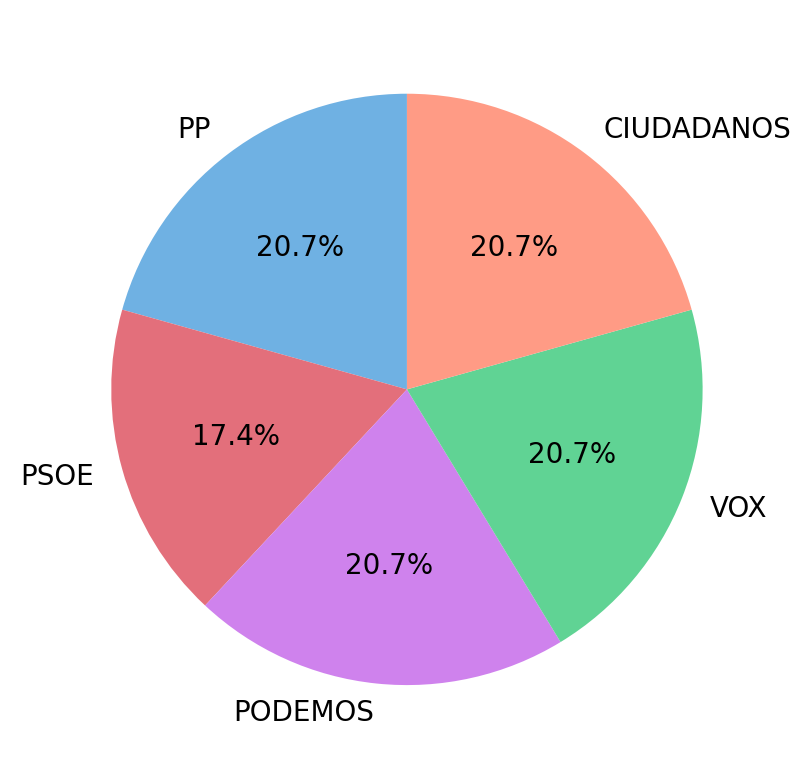

In [ ]:
%config InlineBackend.figure_format = 'retina' 
import matplotlib.pyplot as plt 

palette = ["#6fb1e3","#e36f7b","#cf82ed","#60D394","#FF9B85"]
labels = ['PP','PSOE', 'PODEMOS', 'VOX', 'CIUDADANOS']

plt.pie([PP, PSOE, PODEMOS, VOX, CS], labels=labels, autopct='%1.1f%%', startangle=90,colors=palette)
plt.show()

We have check that the dataset is balanced. Now, let's start cleaning the data. 

In [ ]:
#import re

features = data.text.tolist()
processed_features = []

for sentence in range(0, len(features)):
    # Remove all the special characters and punctuation
    processed_feature = re.sub(r'[^\w\s]', ' ', str(features[sentence])) 

    # remove all single characters
    processed_feature= re.sub(r'\s+[a-zA-Z]\s+', ' ', processed_feature)

    # Remove single characters from the start
    processed_feature = re.sub(r'\^[a-zA-Z]\s+', ' ', processed_feature) 

    # Substituting multiple spaces with single space
    processed_feature = re.sub(r'\s+', ' ', processed_feature, flags=re.I)

    # Removing prefixed 'b'
    processed_feature = re.sub(r'^b\s+', '', processed_feature)

    # Converting to Lowercase
    processed_feature = re.sub('https://t.co','',processed_feature)
    processed_feature = re.sub('https','',processed_feature) # delete missing instances of urls
    processed_feature = re.sub(' co ','',processed_feature) # delete common part of shortcuts in tweets
    processed_feature = re.sub('amp','',processed_feature) # delete &amp entities;

    
    processed_feature = processed_feature.lower()

    processed_features.append(processed_feature)

In [ ]:
import string

def remove_punct(text):
    text  = "".join([char for char in text if char not in string.punctuation])
    text = re.sub('[0-9]+', '', text)
    return text

In [ ]:
data['text'] = processed_features
data['text'] =data['text'].apply(lambda x: remove_punct(x))
data.head(10)

,tweetDate,twitterId,handle,text,profileUrl,name,tweetLink,timestamp,query,type,isReply,replyTo,initialTweet
0,Wed Apr 26 21:48:35 +0000 2023,20509689.0,ppopular,la ley de vivienda también va tener efectos in...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651342533...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
1,Wed Apr 26 21:36:46 +0000 2023,20509689.0,ppopular,ya son más de agresores sexuales beneficiado...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651339560...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
2,Wed Apr 26 20:05:00 +0000 2023,20509689.0,ppopular,partir de las h mtelladof estará en elcascab...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651316466...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
3,Wed Apr 26 20:03:20 +0000 2023,20509689.0,ppopular,rt carmenfunezdg atención temprana es la llave...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651316048...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
4,Wed Apr 26 18:29:46 +0000 2023,20509689.0,ppopular,tenía que leer los insultos rt sí mg evidente...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651292499...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
5,Wed Apr 26 17:13:46 +0000 2023,20509689.0,ppopular,rt ppopular el constructor de mentiras milanun...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651273374...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
6,Wed Apr 26 15:49:00 +0000 2023,20509689.0,ppopular,rt nunezfeijoo por fin hemos arreglado el desa...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651252042...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
7,Wed Apr 26 15:40:08 +0000 2023,20509689.0,ppopular,al ritmo que van las falsas promesas en vivien...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651249810...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
8,Wed Apr 26 15:38:02 +0000 2023,20509689.0,ppopular,rt carmenfunezdg hoy nos hemos reunido con la ...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651249284...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
9,Wed Apr 26 14:14:07 +0000 2023,20509689.0,ppopular,rt nunezfeijoo hoy escuchamos las propuestas d...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651228164...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN


Using worldcloud module we can plot the more frequent word used in the tweets of each political party. 

In [ ]:
pp_data = data[data['handle']=='ppopular']
psoe_data = data[data['handle']=='PSOE']
podemos_data = data[data['handle']=='PODEMOS']
vox_data = data[data['handle']=='vox_es']
cs_data = data[data['handle']=='CiudadanosCs']

pp_tweet_list = pp_data.text.tolist()
pp_text = pp_data.text.tolist()[0]
for d in pp_tweet_list[1::]:
    pp_text = pp_text + d 

psoe_tweet_list = psoe_data.text.tolist()
psoe_text = psoe_data.text.tolist()[0]
for d in psoe_tweet_list[1::]:
    psoe_text = psoe_text + d 

podemos_tweet_list = podemos_data.text.tolist()
podemos_text = podemos_data.text.tolist()[0]
for d in podemos_tweet_list[1::]:
    podemos_text = podemos_text + d 

vox_tweet_list = vox_data.text.tolist()
vox_text = vox_data.text.tolist()[0]
for d in vox_tweet_list[1::]:
    vox_text = vox_text + d 

cs_tweet_list = cs_data.text.tolist()
cs_text = cs_data.text.tolist()[0]
for d in cs_tweet_list[1::]:
    cs_text = cs_text + d 

(-0.5, 461.5, 439.5, -0.5)

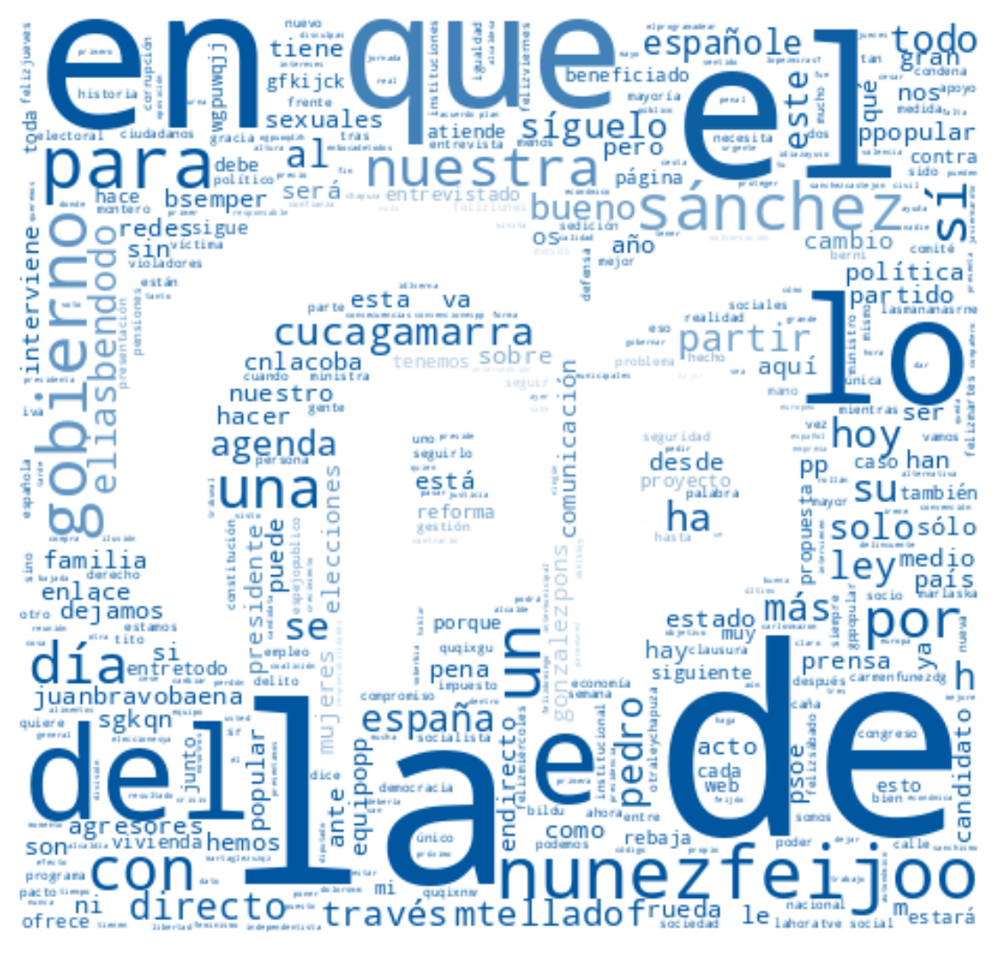

In [ ]:
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from nltk.corpus import stopwords

stopwords = set(STOPWORDS) | {"rt"}

# Generate a word cloud image

mask_pp = np.array(Image.open('/content/drive/MyDrive/Applications_of_Machine_Learning/pp_logo.png'))
mask_vox = np.array(Image.open('/content/drive/MyDrive/Applications_of_Machine_Learning/vox_logo.jpg'))
mask_cs = np.array(Image.open('/content/drive/MyDrive/Applications_of_Machine_Learning/cs_logo.jpg'))
mask_podemos = np.array(Image.open('/content/drive/MyDrive/Applications_of_Machine_Learning/podemos_logo.png'))
mask_psoe = np.array(Image.open('/content/drive/MyDrive/Applications_of_Machine_Learning/PSOE_logo.jpg'))


#Generate the wordcloud object for PP
wordcloud_parties = WordCloud(stopwords=stopwords, mode="RGBA", random_state=1, background_color='white', colormap='Set2', collocations=False, max_words=1000, mask=mask_pp).generate(pp_text)
# create coloring from image
image_colors = ImageColorGenerator(mask_pp)
plt.figure(figsize=[7,7])
plt.imshow(wordcloud_parties.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")

(-0.5, 899.5, 899.5, -0.5)

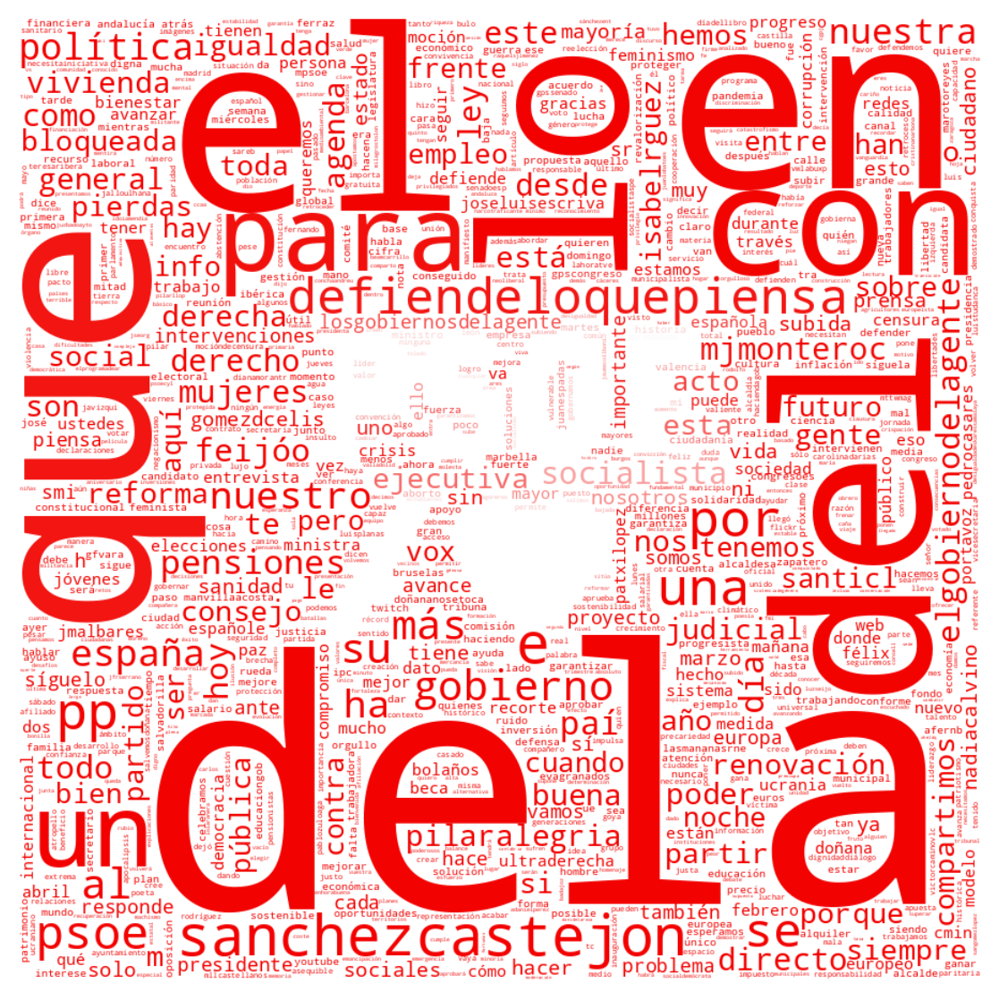

In [ ]:
#Generate the wordcloud object
wordcloud_parties = WordCloud(stopwords=stopwords, mode="RGBA", random_state=1, background_color='white', colormap='Set2', collocations=False, max_words=1000, mask=mask_psoe).generate(psoe_text)
# create coloring from image
image_colors = ImageColorGenerator(mask_psoe)
plt.figure(figsize=[7,7])
plt.imshow(wordcloud_parties.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")

(-0.5, 959.5, 539.5, -0.5)

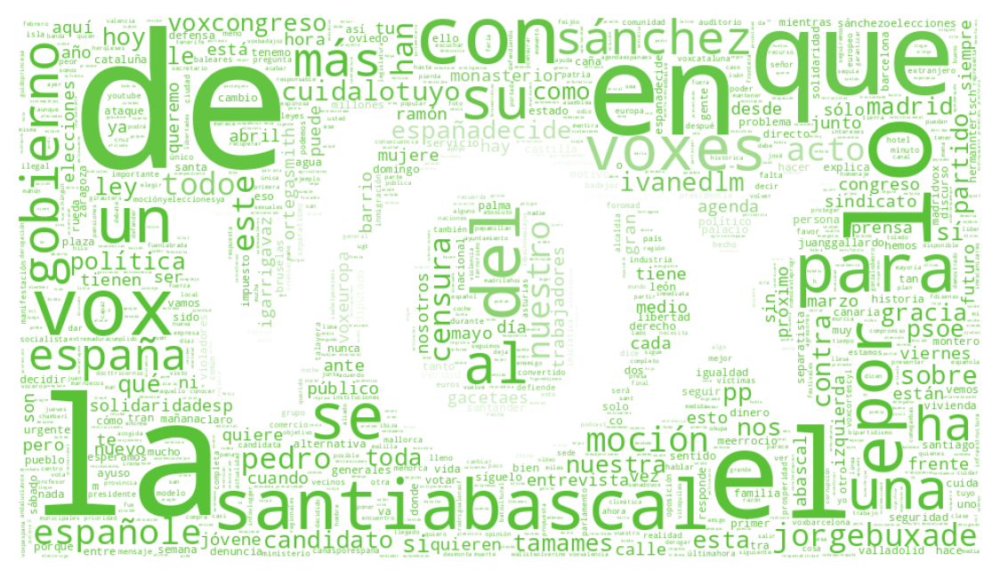

In [ ]:
#Generate the wordcloud object
wordcloud_parties = WordCloud(stopwords=stopwords, mode="RGBA", random_state=1, background_color='white', colormap='Set2', collocations=False, max_words=1000, mask=mask_vox).generate(vox_text)
# create coloring from image
image_colors = ImageColorGenerator(mask_vox)
plt.figure(figsize=[7,7])
plt.imshow(wordcloud_parties.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")

(-0.5, 1247.5, 769.5, -0.5)

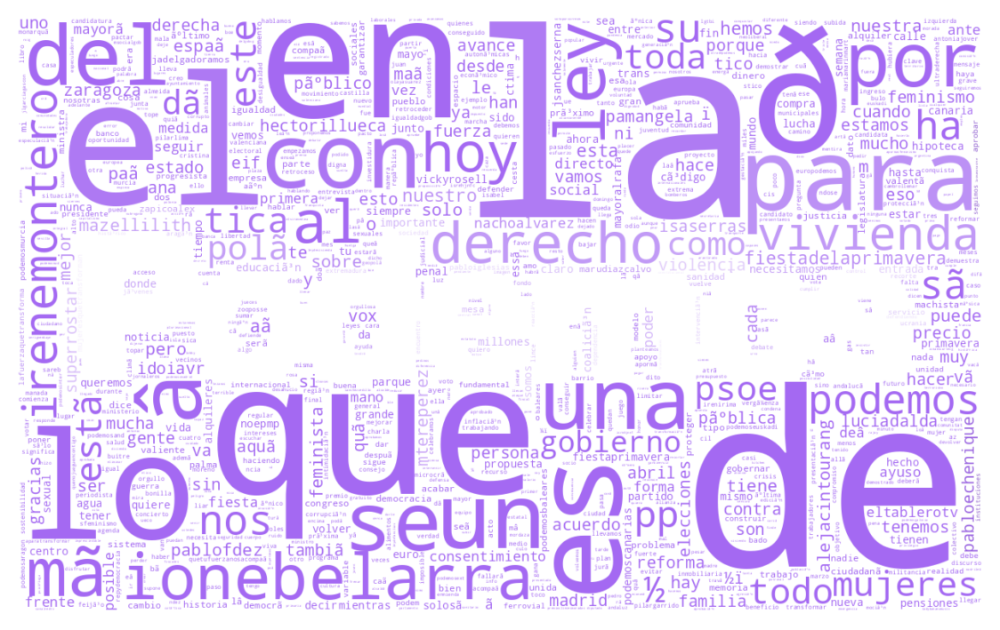

In [ ]:
#Generate the wordcloud object
wordcloud_parties = WordCloud(stopwords=stopwords, mode="RGBA", random_state=1, background_color='white', colormap='Set2', collocations=False, max_words=1000, mask=mask_podemos).generate(podemos_text)
# create coloring from image
image_colors = ImageColorGenerator(mask_podemos)
plt.figure(figsize=[7,7])
plt.imshow(wordcloud_parties.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")

(-0.5, 799.5, 513.5, -0.5)

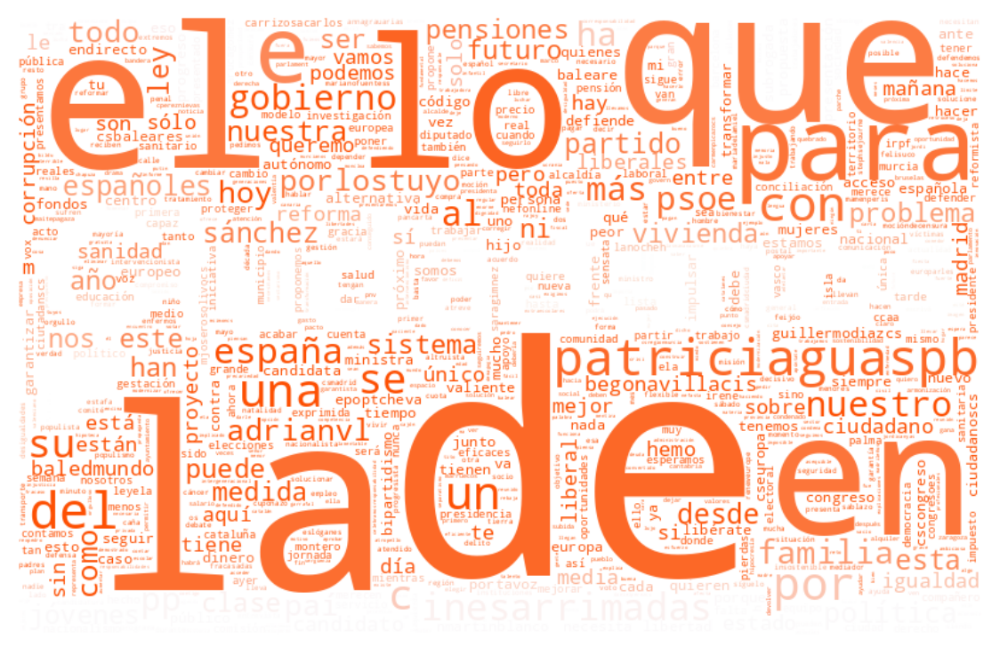

In [ ]:
#Generate the wordcloud object
wordcloud_parties = WordCloud(stopwords=stopwords, mode="RGBA", random_state=1, background_color='white', colormap='Set2', collocations=False, max_words=1000, mask=mask_cs).generate(cs_text)
# create coloring from image
image_colors = ImageColorGenerator(mask_cs)
plt.figure(figsize=[7,7])
plt.imshow(wordcloud_parties.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")

Now the most frequent words are part of stop words in Spanish language. 
The next step is to tokenize, remove stopwords and stem words:

In [ ]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import SnowballStemmer

nltk.download('punkt')
nltk.download('stopwords')

# Load the Spanish stop words
stop_words = set(stopwords.words('spanish')) | {"rt"}

# Load the Spanish stemmer
stemmer = SnowballStemmer('spanish')

def preprocess_data(data):    

    for i in range(len(data)):

      # Remove URLs
      data['text'][i] = re.sub(r'http\S+', '', data['text'][i])
      
      # Tokenize into individual words
      words = word_tokenize(data['text'][i])
      
      # Remove stop words
      words = [word for word in words if word not in stop_words]
      
      # Stem words
      words = [stemmer.stem(word) for word in words]
      
      # Join the words back into a string
      data['text'][i] = ' '.join(words)
    
    return data


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


Having the function that compute different step we can create a loop that iterates through every tweet and pass them through this preprocessing function

In [ ]:
data = preprocess_data(data)

<ipython-input-55-278cd0eff3f5>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['text'][i] = re.sub(r'http\S+', '', data['text'][i])
<ipython-input-55-278cd0eff3f5>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['text'][i] = ' '.join(words)


Let's try now to make the worldcloud again:

In [ ]:
pp_data = data[data['handle']=='ppopular']
psoe_data = data[data['handle']=='PSOE']
podemos_data = data[data['handle']=='PODEMOS']
vox_data = data[data['handle']=='vox_es']
cs_data = data[data['handle']=='CiudadanosCs']

pp_tweet_list = pp_data.text.tolist()
pp_text = pp_data.text.tolist()[0]
for d in pp_tweet_list[1::]:
    pp_text = pp_text + d 

psoe_tweet_list = psoe_data.text.tolist()
psoe_text = psoe_data.text.tolist()[0]
for d in psoe_tweet_list[1::]:
    psoe_text = psoe_text + d 

podemos_tweet_list = podemos_data.text.tolist()
podemos_text = podemos_data.text.tolist()[0]
for d in podemos_tweet_list[1::]:
    podemos_text = podemos_text + d 

vox_tweet_list = vox_data.text.tolist()
vox_text = vox_data.text.tolist()[0]
for d in vox_tweet_list[1::]:
    vox_text = vox_text + d 

cs_tweet_list = cs_data.text.tolist()
cs_text = cs_data.text.tolist()[0]
for d in cs_tweet_list[1::]:
    cs_text = cs_text + d 


In [ ]:
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from nltk.corpus import stopwords

stopwords = set(STOPWORDS) | {"rt"}

(-0.5, 461.5, 439.5, -0.5)

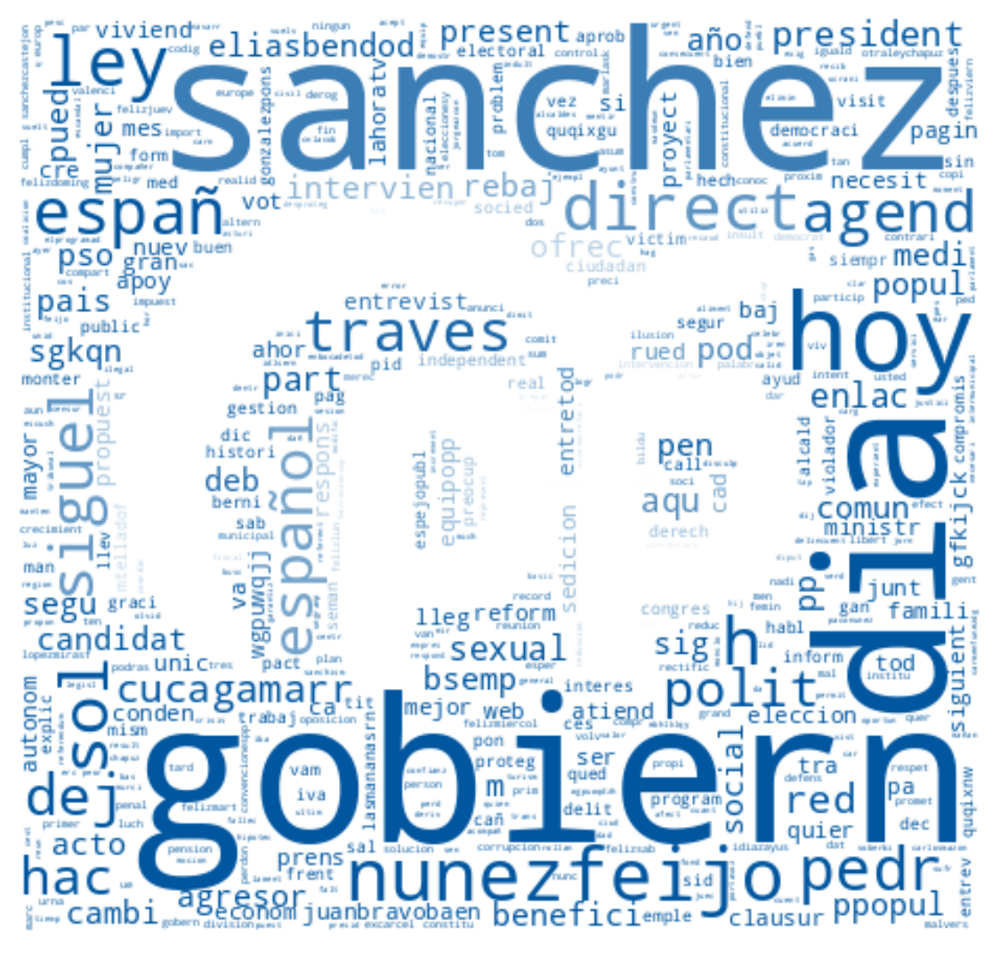

In [ ]:
#Generate the wordcloud object for PP
wordcloud_parties = WordCloud(stopwords=stopwords, mode="RGBA", random_state=1, background_color='white', colormap='Set2', collocations=False, max_words=1000, mask=mask_pp).generate(pp_text)
# create coloring from image
image_colors = ImageColorGenerator(mask_pp)
plt.figure(figsize=[7,7])
plt.imshow(wordcloud_parties.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")

(-0.5, 899.5, 899.5, -0.5)

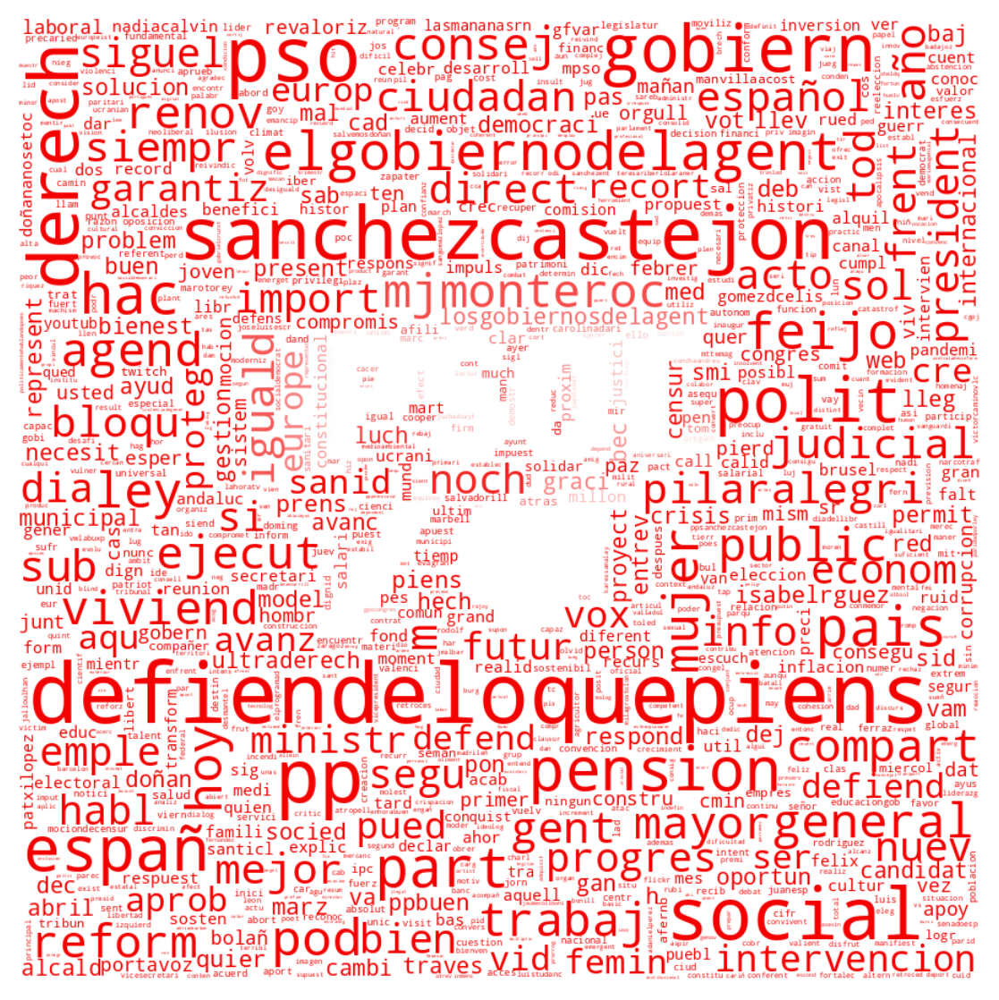

In [ ]:
#Generate the wordcloud object
wordcloud_parties = WordCloud(stopwords=stopwords, mode="RGBA", random_state=1, background_color='white', colormap='Set2', collocations=False, max_words=1000, mask=mask_psoe).generate(psoe_text)
# create coloring from image
image_colors = ImageColorGenerator(mask_psoe)
plt.figure(figsize=[7,7])
plt.imshow(wordcloud_parties.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")

(-0.5, 959.5, 539.5, -0.5)

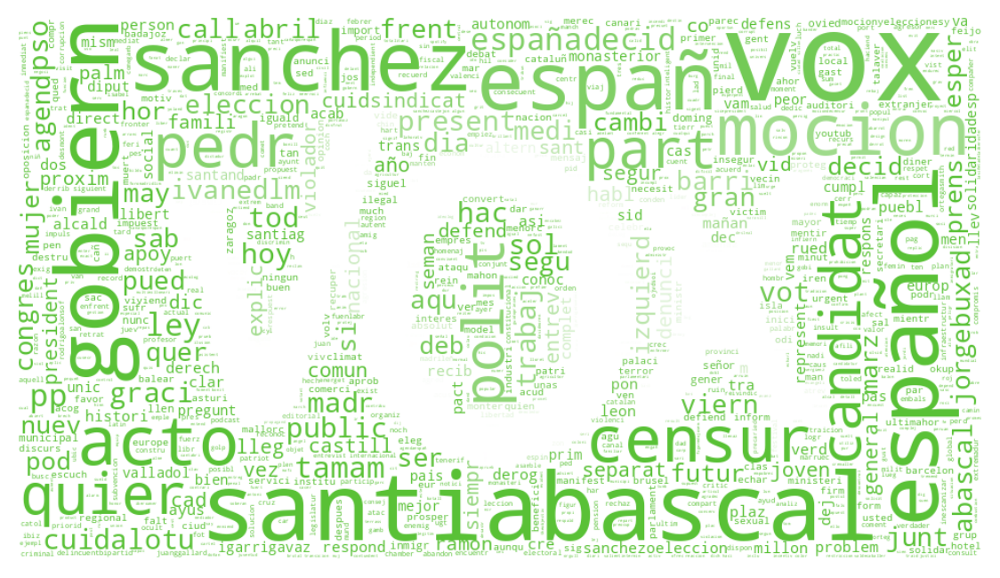

In [ ]:
#Generate the wordcloud object
wordcloud_parties = WordCloud(stopwords=stopwords, mode="RGBA", random_state=1, background_color='white', colormap='Set2', collocations=False, max_words=1000, mask=mask_vox).generate(vox_text)
# create coloring from image
image_colors = ImageColorGenerator(mask_vox)
plt.figure(figsize=[7,7])
plt.imshow(wordcloud_parties.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")

(-0.5, 1247.5, 769.5, -0.5)

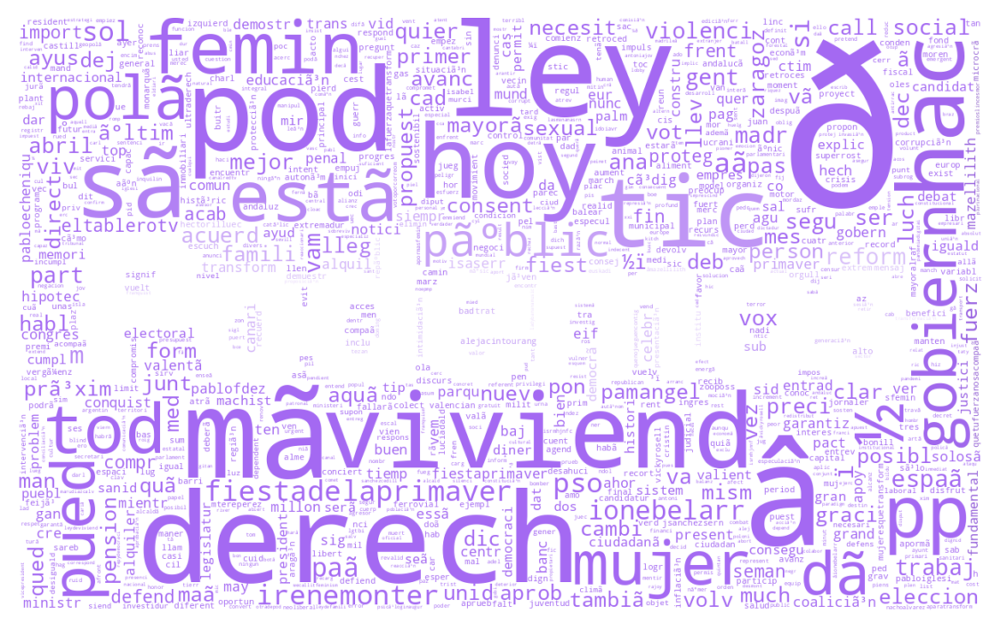

In [ ]:
#Generate the wordcloud object
wordcloud_parties = WordCloud(stopwords=stopwords, mode="RGBA", random_state=1, background_color='white', colormap='Set2', collocations=False, max_words=1000, mask=mask_podemos).generate(podemos_text)
# create coloring from image
image_colors = ImageColorGenerator(mask_podemos)
plt.figure(figsize=[7,7])
plt.imshow(wordcloud_parties.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")

(-0.5, 799.5, 513.5, -0.5)

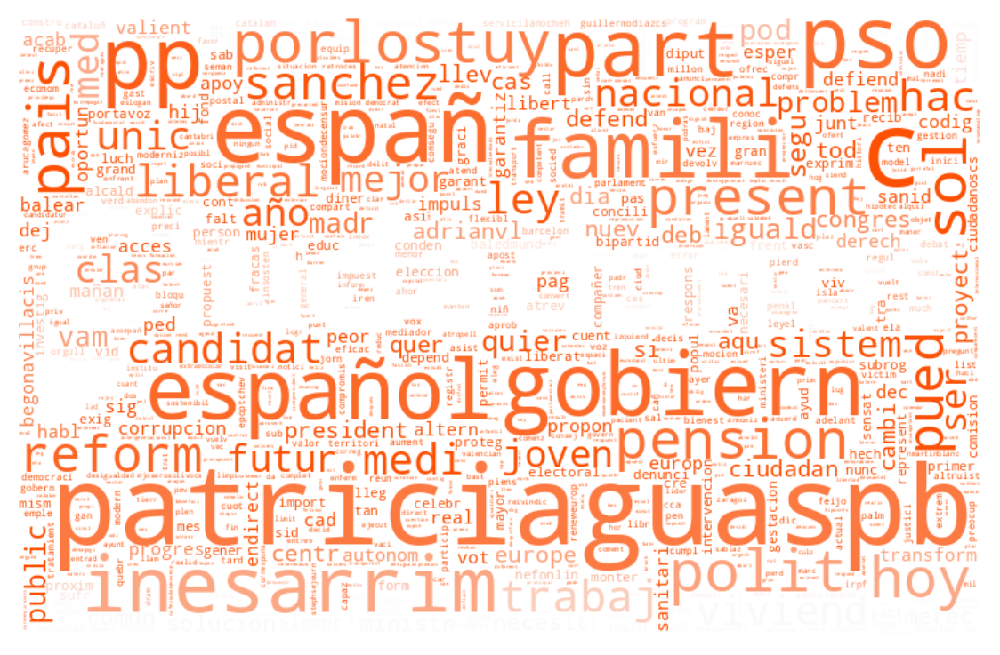

In [ ]:
#Generate the wordcloud object
wordcloud_parties = WordCloud(stopwords=stopwords, mode="RGBA", random_state=1, background_color='white', colormap='Set2', collocations=False, max_words=1000, mask=mask_cs).generate(cs_text)
# create coloring from image
image_colors = ImageColorGenerator(mask_cs)
plt.figure(figsize=[7,7])
plt.imshow(wordcloud_parties.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")

In [ ]:
data.head(3)

,tweetDate,twitterId,handle,text,profileUrl,name,tweetLink,timestamp,query,type,isReply,replyTo,initialTweet
0,Wed Apr 26 21:48:35 +0000 2023,20509689.0,ppopular,ley viviend va ten efect indes sub preci men o...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651342533...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
1,Wed Apr 26 21:36:46 +0000 2023,20509689.0,ppopular,agresor sexual benefici irrespons gobiern mtel...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651339560...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN
2,Wed Apr 26 20:05:00 +0000 2023,20509689.0,ppopular,part h mtelladof elcascabeltrec pued segu trav...,https://twitter.com/ppopular,Partido Popular,https://twitter.com/ppopular/status/1651316466...,27/04/2023 0:14,https://twitter.com/ppopular,tweets-replies,NaN,NaN,NaN


## Vectorization of the testing set

We have a collection of documents that needs to be vectorized in order to apply machine learning models

In [ ]:
bow_test, tfidf_test, gensim_embeddings_test, keras_embeddings_test, doc2vec_test = data_vectorization(data)

print("This is bow", bow_test.shape, end='\n\n')
print("This is tf-idf", tfidf_test.shape, end='\n\n')
print("This is w2vec (gensim)", np.array(gensim_embeddings_test, dtype=object).shape, end='\n\n')
print("This is keras embeddings", np.array(keras_embeddings_test).shape, end='\n\n')
print("This is doc2vec", np.array(doc2vec_test).shape, end='\n\n')


303/303 [==============================] - 0s 1ms/step


This is bow (9685, 1000)

This is tf-idf (9685, 1000)

This is w2vec (gensim) (9685, 100, 100)

This is keras embeddings (9685, 100)

This is doc2vec (9685, 100)



# 5. Training and evaluation of the ML Model

In [ ]:
dataset

,text,target
760427,i love healthuandpets u guy r best,1
760428,im meeting one besties tonight cant wait girl ...,1
760429,darealsunisakim thanks twitter add,1
760430,being sick really cheap hurt much eat real foo...,1
760431,lovesbrooklyn effect everyone,1
...,...,...
19995,didnt win smart damn it,0
19996,it taking long time back file mbp wtimemachine...,0
19997,philhellmuth sorry hear,0
19998,want add photo but wont let,0


In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from joblib import dump, load

# Load pre-processed tweet data and labels
X = bow_fulltrain  # N x D feature matrix
y = dataset['target']   # N x 1 label vector

# Split data into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

# Train SVM classifier on training data
# svm = SVC(kernel='linear', C=1)
# svm.fit(X_train, y_train)
# dump(svm, 'svm1_.joblib')

svm = load('/content/drive/MyDrive/Applications_of_Machine_Learning/svm1_73_5.joblib')

# Test the model on the validation data
y_pred = svm.predict(X_valid)
acc = accuracy_score(y_valid, y_pred)

print("Accuracy considering BoW:", acc)


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator SVC from version 1.2.1 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Accuracy considering BoW: 0.735


In [ ]:
# Load pre-processed tweet data and labels
X = tfidf_fulltrain  # N x D feature matrix
y = dataset['target']   # N x 1 label vector

# Split data into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

# Train SVM classifier on training data
# svm = SVC(kernel='linear', C=1)
# svm.fit(X_train, y_train)
# dump(svm, 'svm2_73_1875.joblib')

svm = load('/content/drive/MyDrive/Applications_of_Machine_Learning/svm2_73_1875.joblib')

# Test the model on the validation data
y_pred = svm.predict(X_valid)
acc = accuracy_score(y_valid, y_pred)

print("Accuracy considering TF-IDF vectorization:", acc)


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator SVC from version 1.2.1 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Accuracy considering TF-IDF vectorization: 0.731875


In [ ]:
# Load pre-processed tweet data and labels
X = keras_embeddings_fulltrain  # N x D feature matrix
y = dataset['target']   # N x 1 label vector

# Split data into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

# Train SVM classifier on training data
# svm = SVC(kernel='linear', C=1)
# svm.fit(X_train, y_train)
# dump(svm, 'svm3_54_4125.joblib')

svm = load('/content/drive/MyDrive/Applications_of_Machine_Learning/svm3_54_4125.joblib')


# Test the model on the validation data
y_pred = svm.predict(X_valid)
acc = accuracy_score(y_valid, y_pred)

print("Accuracy considering Keras vectorization:", acc)


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator SVC from version 1.2.1 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Accuracy considering Keras vectorization: 0.498875


In [ ]:
# Load pre-processed tweet data and labels
X = doc2vec_fulltrain  # N x D feature matrix
y = dataset['target']   # N x 1 label vector

# Split data into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

# Train SVM classifier on training data
# svm = SVC(kernel='linear', C=1)
# svm.fit(X_train, y_train)
# dump(svm, 'svm4_49_825.joblib')

svm = load('/content/drive/MyDrive/Applications_of_Machine_Learning/svm4_49_825.joblib')


# Test the model on the validation data
y_pred = svm.predict(X_valid)
acc = accuracy_score(y_valid, y_pred)

print("Accuracy considering doc2vec text vectorization:", acc)


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator SVC from version 1.2.1 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Accuracy considering doc2vec text vectorization: 0.49825


In [ ]:
# Load pre-processed tweet data and labels
X = keras_embeddings_fulltrain  # N x D feature matrix
y = dataset['target']   # N x 1 label vector

# Split data into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

# Train SVM classifier on training data
# svm = SVC(kernel='linear', C=1)
# svm.fit(X_train, y_train)
# dump(svm, 'svm5_55_1.joblib')

svm = load('/content/drive/MyDrive/Applications_of_Machine_Learning/svm5_55_1.joblib')


# Test the model on the validation data
y_pred = svm.predict(X_valid)
acc = accuracy_score(y_valid, y_pred)

print("Accuracy considering Keras vectorization:", acc)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator SVC from version 1.2.1 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Accuracy considering Keras vectorization: 0.488375


We can see that among all the experiments, the machine learning model that works better is the Bag of Words one (which provides a 73.5% of accuracy), followed closely by the TF-IDF one (with a 73.18% of accuracy).


# 6. Comparison against pre-trained transformers (positivity and hate speech)

To check about the subjectivity and polarization (or positivity and negativity) of each political parties' tweets, we will use two popular pre-trained model, as well as to have some insights on their performance.

In the first case, VADER is only available in English, so we have translated our database to English with the Google Translator API (in a local file, as it was time-infeasible in Colab Cloud).

In the second case, pysentimento is trained with Spanish tweets, so we have kept the original tweets.


## Ruler-Based approach: VADER

VADER uses a list of lexical features (e.g. word) which are labeled as positive or negative according to their semantic orientation to calculate the text sentiment. It returns  the probability of a given input sentence to be positive, negative or neutral. 

**Pros of Ruler-Based approach for Sentiment Analysis**

*   It works particularly well for negative statements
*   It is widely used in social media (Twitter, Facebook, etc.) texts as it is one of the most finely-trained models for this purpose.

**Cons of Ruler-Based approach for Sentiment Analysis**

*   The main drawback with the rule-based approach for sentiment analysis is that the method only cares about individual words and completely ignores the context in which it is used. 


In [ ]:
try:
  from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
except ModuleNotFoundError:
  !pip install vaderSentiment
  from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 3.1 MB/s eta 0:00:00


In [ ]:
dataset = dataset.sample(frac=1).reset_index(drop=True)
dataset

,text,target
0,didnt sleep last night terrible dream caught c...,0
1,eeoor pleasure let know end subbing,1
2,finally boarding flight sf come,1
3,s wow skillz little rusty,0
4,wish would talk,0
...,...,...
39995,the life cool but not me,0
39996,i dont wanna root canal,0
39997,is gonna painting,1
39998,i miss sparky boyfriend doggie didnt get see t...,0


In [ ]:
dataset['good'] = np.nan
dataset['neutral'] = np.nan
dataset['bad'] = np.nan
dataset['compound'] = np.nan
dataset['pred'] = np.nan

analyzer = SentimentIntensityAnalyzer()
for i, sentence in dataset.iterrows():
    vs = analyzer.polarity_scores(sentence['text'])
    dataset['good'].iloc[i] = vs['pos']
    dataset['neutral'].iloc[i] = vs['neu']
    dataset['bad'].iloc[i] = vs['neg']
    dataset['compound'].iloc[i] = vs['compound']
    

<ipython-input-74-0d2cd5c94aec>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['good'].iloc[i] = vs['pos']
<ipython-input-74-0d2cd5c94aec>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['neutral'].iloc[i] = vs['neu']
<ipython-input-74-0d2cd5c94aec>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['bad'].iloc[i] = vs['neg']
<ipython-input-74-0d2cd5c94aec>:13: SettingWithCopyWarning: 
A value is trying to b

<ipython-input-75-d88c109c8f4d>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['pred'][dataset['compound'] > i] = 1
<ipython-input-75-d88c109c8f4d>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['pred'][dataset['compound'] > np.linspace(-1,1,100)[max]] = 1


-0.010101010101010055
0.643325


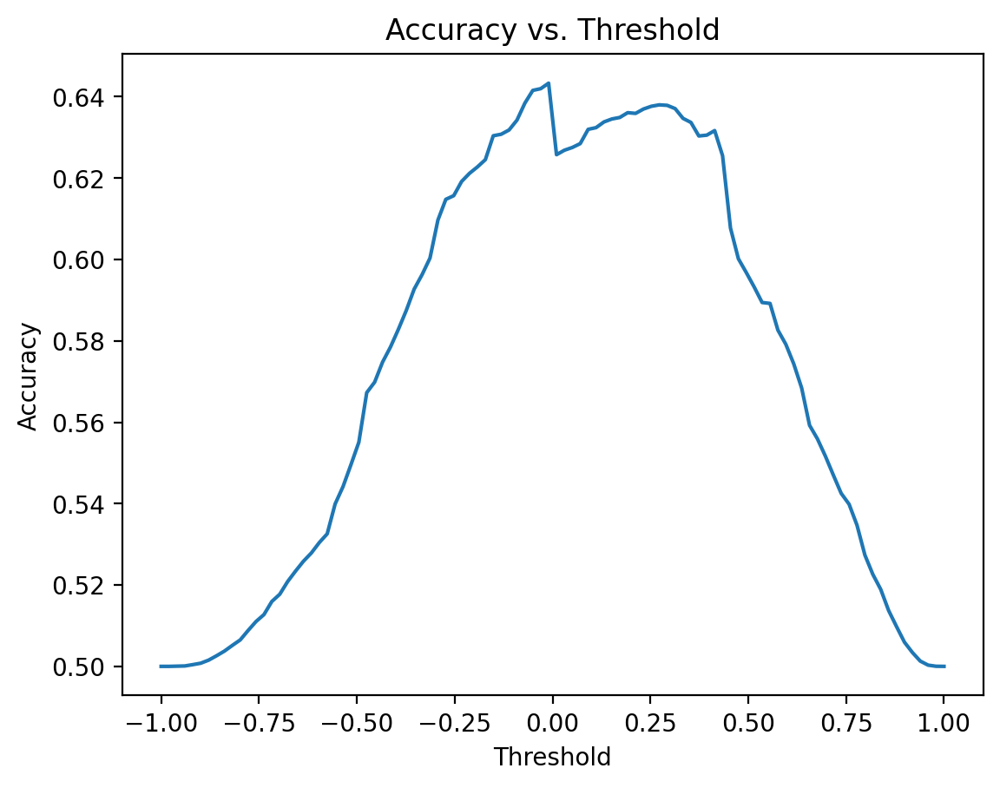

In [ ]:
accs = []
for i in np.linspace(-1,1,100):
    dataset['pred'] = 0
    dataset['pred'][dataset['compound'] > i] = 1

    accs.append(np.mean(dataset['target'] == dataset['pred']))
plt.plot(np.linspace(-1,1,100),accs)    
plt.xlabel('Threshold')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Threshold')

max = np.argmax(accs)
print(np.linspace(-1,1,100)[max])
print(accs[max])

dataset['pred'] = 0
dataset['pred'][dataset['compound'] > np.linspace(-1,1,100)[max]] = 1

## Embedded-based approach: pysentimiento

Embedded-based transformers, also known as contextualized word embeddings, are a type of transformer models that generate word representations based on the context in which they appear. Unlike rule-based transformers that rely on predefined grammatical or syntactic rules, embedded-based transformers learn representations directly from large amounts of text data. This allows them to capture more nuanced and contextual information, leading to improved performance on various NLP tasks.

**Advantages of embedded-based transformers:**

* Capture context-dependent meanings and nuances of words
* Handle long-range dependencies effectively
* Can handle out-of-vocabulary words through subword tokenization
* Achieve state-of-the-art performance on various NLP tasks

**Disadvantages of embedded-based transformers:**

* Require substantial computational resources and large training data
* Time-consuming fine-tuning process with labeled data
* Lack explicit interpretability and transparency in decision-making process


## **What is pysentimiento?**

pysentimiento features a tweet preprocessor specially suited for tweet classification with transformer-based models in Spanish language.
It incorporates the use of various language processing libraries and resources, such as NLTK (Natural Language Toolkit), to perform these tasks. It is based in Base model is RoBERTuito, a BERT (BERT (Bidirectional Encoder Representations from Transformers) model for user-generated content in Spanish, trained following RoBERTa guidelines on 500 million tweets.

In [ ]:
!pip install pysentimiento
from pysentimiento import create_analyzer
from pysentimiento.preprocessing import preprocess_tweet

analyzer = create_analyzer(task="sentiment", lang="es")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 474.6/474.6 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.5/887.5 MB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.4/175.4 kB 14.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 33.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 41.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 20.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 20.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.3/134.3 kB 13.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 317.1/317.1 MB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.0/21.

In [ ]:
tweet = data_trans["text"][3]
print("This is the example tweet:", tweet)

This is the example tweet: RT @carmenfunezdg: Atención temprana es la llave para construir una sociedad inclusiva en la que los derechos de las personas con discapaci


Pysentimiento provides a function to preprocess tweets prior to predict its sentiment, which replaces user handles and URLs by special tokens, shortens repeated characters, normalizes laughters, handles hashtags and emojis.

In [ ]:
preprocess_tweet(tweet)

'RT @usuario: Atención temprana es la llave para construir una sociedad inclusiva en la que los derechos de las personas con discapaci'

In [ ]:
analyzer.predict(tweet)

AnalyzerOutput(output=POS, probas={POS: 0.487, NEU: 0.433, NEG: 0.081})

We appreciate that this sample tweet is mostly positive or neutral, which is quite accurate.

In [ ]:
hate_speech_analyzer = create_analyzer(task="hate_speech", lang="es") #create the analyzer

In [ ]:
hate_speech_analyzer.predict(tweet) #accurate prediction

AnalyzerOutput(output=[], probas={hateful: 0.023, targeted: 0.004, aggressive: 0.010})

Now let's extend it to our complete database:

In [ ]:
tweets = []
for i in data_trans["text"]:
  tweets.append(i)

In [ ]:
sentiment_predictions = []
hate_speech_predictions = []
data_trans['sentiment_prediction'] = ""
data_trans['hate_speech_prediction'] = ""

for tweet in tweets:
    preprocessed_tweet = preprocess_tweet(tweet)
    prediction = analyzer.predict(preprocessed_tweet)
    hate_speech_prediction = hate_speech_analyzer.predict(preprocessed_tweet)
    
    # Append the predictions to the respective lists
    sentiment_predictions.append(prediction)
    hate_speech_predictions.append(hate_speech_prediction)

In [ ]:
data_trans['sentiment_prediction'] = sentiment_predictions
data_trans['hate_speech_prediction'] = hate_speech_predictions

In [ ]:
# Now, we have the object with all information per each tweet, and we can extract it like this:
# For the fourth tweet:

sentiment_prediction_4 = data_trans['sentiment_prediction'][4].output
hate_speech_prediction_4 = data_trans['hate_speech_prediction'][4].output

sentiment_probas_4 = data_trans['sentiment_prediction'][4].probas
hate_speech_probas_4 = data_trans['hate_speech_prediction'][4].probas

print("Sentiment prediction:", sentiment_prediction_4)
print("**Further details**:", sentiment_probas_4)
print("---------------")
print("Hate speech prediction:", hate_speech_prediction_4)
print("**Further details**:", hate_speech_probas_4)

Sentiment prediction: NEG
**Further details**: {'NEG': 0.6441056728363037, 'NEU': 0.3293922245502472, 'POS': 0.026502108201384544}
---------------
Hate speech prediction: []
**Further details**: {'hateful': 0.035735610872507095, 'targeted': 0.01263338141143322, 'aggressive': 0.01681421510875225}


In [ ]:
data_trans['sentiment_prediction'][4].probas

{'NEG': 0.6441056728363037,
 'NEU': 0.3293922245502472,
 'POS': 0.026502108201384544}

In [ ]:
plt.scatter(data_trans['sentiment_prediction'].probas)

AttributeError: ignored

In [ ]:
accs = []
for i in np.linspace(-1,1,100):
    dataset['pred2'] = 0
    dataset['pred2'][dataset['compound'] > i] = 1

    accs.append(np.mean(dataset['target'] == dataset['pred2']))
plt.xlabel('Threshold')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Threshold')
plt.plot(np.linspace(-1,1,100),accs)    

max = np.argmax(accs)
print(np.linspace(-1,1,100)[max])
print(accs[max])

dataset['pred2'] = 0
dataset['pred2'][dataset['compound'] > np.linspace(-1,1,100)[max]] = 1

# Classification on the test set

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/Applications_of_Machine_Learning/datatranslated.csv')
data['pred'] = np.nan
data['score'] = np.nan


analyzer = SentimentIntensityAnalyzer()
for i, sentence in data.iterrows():
    vs = analyzer.polarity_scores(sentence['textEng'])
    data['score'].iloc[i] = vs['compound']


data['pred'] = 0
data['pred'][data['score'] > np.linspace(-1,1,100)[max]] = 1

In [ ]:
data[['text','textEng', 'score', 'pred']]

# LDA: Topic modelling with gensim

In [ ]:
import gensim
from gensim.models import CoherenceModel
from gensim import corpora
from pprint import pprint

# create a list of text documents
text = dataset['text']

# preprocess the text data
preprocessed_text = [document.lower().split() for document in text]

# create a dictionary of terms and their frequency
dictionary = corpora.Dictionary(preprocessed_text)

# create a bag of words corpus
corpus = [dictionary.doc2bow(document) for document in preprocessed_text]

# define the range of topics to try
topic_range = np.linspace(1,51,11)

# train the LDA model
perplexity_scores = []
for num_topics in topic_range:
    lda_model = gensim.models.ldamodel.LdaModel(corpus, num_topics=num_topics, id2word=dictionary, passes=2)
    perplexity_scores.append(lda_model.log_perplexity(corpus))

# plot the perplexity scores
import matplotlib.pyplot as plt
plt.plot(list(topic_range), perplexity_scores)
plt.xlabel('Number of topics')
plt.ylabel('Perplexity score')
plt.show()

# choose the number of topics of lowest perplexity
best_num_topics = topic_range[perplexity_scores.index(min(perplexity_scores))]
print('Best number of topics:', best_num_topics)

# train the LDA model on the corpus with the best number of topics
lda_model = gensim.models.ldamodel.LdaModel(corpus, num_topics=best_num_topics, id2word=dictionary, passes=2)
pprint(lda_model.print_topics())




In [ ]:
lda_model.show_topics(num_topics=-1, num_words=5, log=False, formatted=True)

# More data visualizations on political tweets

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
df = data[['timestamp', 'name', 'score']]
df['name'] = df['name'].apply(lambda x: str(x).strip('?'))
df = df.where(df['name'] != 'nan')

# Group the data by political party and sum the scores for each group
grouped_df = df.groupby(['name']).sum(numeric_only=False).reset_index()

# Set the figure size and style
plt.figure(figsize=(18, 4))
sns.set_style('whitegrid')

# Define a color palette with 10 colors
color_palette = sns.color_palette('hls', n_colors=10)

# Loop over the unique political parties and plot a histogram of their scores
for i, party in enumerate(grouped_df['name'].unique()):
    party_scores = df[df['name'] == party]['score']
    plt.subplot(1, 5, i+1)
    plt.hist(party_scores, bins=10, color=color_palette[i])
    plt.title(party)
    plt.xlabel('Score')
    plt.ylabel('Frequency')
    plt.ylim([0, 800]) # set the same y-axis limit for all subplots
    
# Add the title
plt.suptitle('Distribution of Political Parties Scores', fontsize=18)

# Adjust the spacing between subplots
plt.tight_layout()
# plt.savefig('plot1.png')
# Show the plot
plt.show()


In [ ]:
# Group the data by political party and sum the scores for each group
grouped_df = df.groupby(['name']).sum(numeric_only=False).reset_index()

# Bar plot of total scores for each political party
plt.figure(figsize=(10, 6))
sns.barplot(data=grouped_df, x='name', y='score')
plt.title('Total Scores by Political Party')
plt.xlabel('Political Party')
plt.ylabel('Total Score')
# plt.savefig('plot2.png')
plt.show()

# Box plot of score distributions for each political party
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='name', y='score')
plt.title('Score Distributions by Political Party')
plt.xlabel('Political Party')
plt.ylabel('Score')
# plt.savefig('plot3.png')
plt.show()

# Violin plot of score distributions for each political party
plt.figure(figsize=(10, 6))
sns.violinplot(data=df, x='name', y='score')
plt.title('Score Distributions by Political Party')
plt.xlabel('Political Party')
plt.ylabel('Score')
# plt.savefig('plot4.png')
plt.show()
plt.tight_layout()


In [ ]:
# Define the function to categorize the tweets as positive, negative, or neutral
def categorize_score(score):
    if score > 0.3:
        return 'Positive'
    elif score < -0.3:
        return 'Negative'
    else:
        return 'Neutral'

# Categorize the scores for each tweet
df['sentiment'] = df['score'].apply(categorize_score)

# Group the data by political party and sentiment
grouped_df = df.groupby(['name', 'sentiment']).size().reset_index(name='count')

# Pivot the data to create a matrix with each party's sentiment counts
pivot_df = grouped_df.pivot(index='name', columns='sentiment', values='count')

# Set the figure size and style
plt.figure(figsize=(5, 25))
sns.set_style('whitegrid')

# Create a pie chart for each party showing the sentiment proportions
for i, party in enumerate(pivot_df.index):
    sentiment_counts = pivot_df.loc[party].tolist()
    labels = pivot_df.columns.tolist()
    plt.subplot(5, 1, i+1)
    plt.pie(sentiment_counts, labels=labels, autopct='%1.1f%%')
    plt.title('{}'.format(party))
    plt.axis('equal')
# plt.savefig(f'plot_pie.png')

plt.subplots_adjust(vspace=0.5)
# Show the plots
plt.show()


# Saving the environment

In [ ]:
# Internal configuration to keep the variables in a session and not running models altogether every time

# #!pip install dill
# #!pip install pysentimiento
# import dill

# from google.colab import drive
# import os
# drive.mount('/content/drive/')
# cwd = os.getcwd()

# # dill.dump_session('/content/drive/MyDrive/Applications_of_Machine_Learning/SESSION.pkl')
# ### to restore session:
# dill.load_session('/content/drive/MyDrive/Applications_of_Machine_Learning/SESSION.pkl')

# Final conclusions
In conclusion, the project focusing on the analysis of Spanish political tweets using vectorization, natural language processing (NLP), and machine learning models, particularly employing Latent Dirichlet Allocation (LDA) for topics, has provided valuable insights into understanding public sentiment and political discourse.

By leveraging vectorization techniques, the project effectively transformed textual data into numerical representations, enabling the application of NLP algorithms and machine learning models.
Through this comprehensive approach, the project not only showcased the capabilities of NLP and machine learning in analyzing social media data but also contributed to a deeper understanding of political conversations on Twitter and recurrent patterns that you would not notice in any other way.




